The goal of this project build a fraud detection model using an unlabeled dataset from Palpay, using popular machine learning-based techniques for anomaly detection.

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import seaborn
import matplotlib.dates as md
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

### 1.Data Preprocessing

#### 1.1 Loading Data

In [2]:
data = pd.read_csv("palpay_card_transactions_sample.csv")

In [3]:
data

,Transaction Date,Card Category,Card Type,Card Type AR,Channel,Channel AR,Transaction Type,Transaction Type Group,Entry Mode,Transaction Status,Outlet ID,Merchant Acronym,Merchant Desc,Merchant Country,Merchant Activity,Merchant Activity sub,Client Code,Amount,Amount USD,Transaction Currency
0,1-Jan-23,Palpay Cards,Visa Classic Debit,???? ?????? ??? ????????,ATM,???????? ??????,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,ALNASER NEW,BOP EL Naser St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00589393,-300.0,-86.460,ILS
1,1-Jan-23,Palpay Cards,Visa Classic Debit,???? ?????? ??? ????????,ATM,???????? ??????,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,ALNASER NEW,BOP EL Naser St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00589393,-100.0,-28.820,ILS
2,1-Jan-23,Palpay Cards,Visa Classic Debit,???? ?????? ??? ????????,POS,???? ?????,Purchase,Purchases,Chip & Pin,PROCESSED,110002413,YOUSEF MARKET,YOUSEF MARKET >YOUSEF MARKETPS,Palestine,NaN,"Grocery stores,supermarkets",P00589801,-50.0,-14.409,ILS
3,1-Jan-23,Palpay Cards,Visa Classic Debit,???? ?????? ??? ????????,ATM,???????? ??????,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,ALNASER NEW,BOP EL Naser St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00565050,-1100.0,-317.000,ILS
4,1-Jan-23,Palpay Cards,Visa Classic Debit,???? ?????? ??? ????????,ATM,???????? ??????,Withdrawal,ATM Transactions,Other,PROCESSED,800000010,DEIR BALAH OLD,BOP Salah ElDain St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00575741,-150.0,-43.230,ILS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88089,30-Jun-23,Palpay Cards,Visa Classic Debit,???? ?????? ??? ????????,POS,???? ?????,Purchase,Purchases,Paywave,PROCESSED,310103241,AL BADER MARKET,AL BADER MARKET >BETHLEHEM PS,Palestine,NaN,"Grocery stores,supermarkets",P00357371,-19.0,-5.205,ILS
88090,30-Jun-23,Palpay Cards,Visa Classic Debit,???? ?????? ??? ????????,ATM,???????? ??????,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,OMAR ELMOKHTAR,BOP OMAR ELMOKHTAR ST - GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00494710,-600.0,-600.000,USD
88091,30-Jun-23,Palpay Cards,Visa Classic Debit,???? ?????? ??? ????????,ATM,???????? ??????,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,OMAR ELMOKHTAR,BOP OMAR ELMOKHTAR ST - GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00352736,-1000.0,-1000.000,USD
88092,30-Jun-23,Palpay Cards,Visa Classic Debit,???? ?????? ??? ????????,POS,???? ?????,Purchase,Purchases,Paywave,PROCESSED,400000936,FAHED REST,FAHED REST >ALREMAL PS,Palestine,Entertainment & Restaurants,"Eating places,Restaurants",P00635693,-9.0,-2.466,ILS


#### 1.2 Understand data

In [4]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88094 entries, 0 to 88093
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Transaction Date        88094 non-null  object 
 1   Card Category           88094 non-null  object 
 2   Card Type               88094 non-null  object 
 3   Card Type AR            88094 non-null  object 
 4   Channel                 88094 non-null  object 
 5   Channel AR              88094 non-null  object 
 6   Transaction Type        88094 non-null  object 
 7   Transaction Type Group  88094 non-null  object 
 8   Entry Mode              88094 non-null  object 
 9   Transaction Status      88094 non-null  object 
 10  Outlet ID               88094 non-null  int64  
 11   Merchant Acronym       87524 non-null  object 
 12  Merchant Desc           87514 non-null  object 
 13  Merchant Country        88094 non-null  object 
 14  Merchant Activity       49577 non-null

In [5]:
print(data.columns)

Index(['Transaction Date ', 'Card Category ', 'Card Type', 'Card Type AR ',
       'Channel ', 'Channel AR ', 'Transaction Type', 'Transaction Type Group',
       'Entry Mode', 'Transaction Status ', 'Outlet ID', ' Merchant Acronym',
       'Merchant Desc', 'Merchant Country', 'Merchant Activity ',
       'Merchant Activity sub ', 'Client Code', 'Amount ', 'Amount USD',
       'Transaction Currency '],
      dtype='object')


In [6]:
data.shape

(88094, 20)

In [7]:
print(data['Transaction Date '].head(10))

0    1-Jan-23
1    1-Jan-23
2    1-Jan-23
3    1-Jan-23
4    1-Jan-23
5    1-Jan-23
6    1-Jan-23
7    1-Jan-23
8    1-Jan-23
9    1-Jan-23
Name: Transaction Date , dtype: object


In [8]:
data['Transaction Date '] = pd.to_datetime(data['Transaction Date '])

#### 1.3 Delete duplicate columns

In [9]:
data.drop(columns=['Card Type AR ', 'Channel AR ', 'Amount ','Transaction Currency '], inplace=True)

In [10]:
print(data.columns)

Index(['Transaction Date ', 'Card Category ', 'Card Type', 'Channel ',
       'Transaction Type', 'Transaction Type Group', 'Entry Mode',
       'Transaction Status ', 'Outlet ID', ' Merchant Acronym',
       'Merchant Desc', 'Merchant Country', 'Merchant Activity ',
       'Merchant Activity sub ', 'Client Code', 'Amount USD'],
      dtype='object')


In [11]:
data

,Transaction Date,Card Category,Card Type,Channel,Transaction Type,Transaction Type Group,Entry Mode,Transaction Status,Outlet ID,Merchant Acronym,Merchant Desc,Merchant Country,Merchant Activity,Merchant Activity sub,Client Code,Amount USD
0,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,ALNASER NEW,BOP EL Naser St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00589393,-86.460
1,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,ALNASER NEW,BOP EL Naser St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00589393,-28.820
2,2023-01-01,Palpay Cards,Visa Classic Debit,POS,Purchase,Purchases,Chip & Pin,PROCESSED,110002413,YOUSEF MARKET,YOUSEF MARKET >YOUSEF MARKETPS,Palestine,NaN,"Grocery stores,supermarkets",P00589801,-14.409
3,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,ALNASER NEW,BOP EL Naser St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00565050,-317.000
4,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,800000010,DEIR BALAH OLD,BOP Salah ElDain St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00575741,-43.230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88089,2023-06-30,Palpay Cards,Visa Classic Debit,POS,Purchase,Purchases,Paywave,PROCESSED,310103241,AL BADER MARKET,AL BADER MARKET >BETHLEHEM PS,Palestine,NaN,"Grocery stores,supermarkets",P00357371,-5.205
88090,2023-06-30,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,OMAR ELMOKHTAR,BOP OMAR ELMOKHTAR ST - GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00494710,-600.000
88091,2023-06-30,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,OMAR ELMOKHTAR,BOP OMAR ELMOKHTAR ST - GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00352736,-1000.000
88092,2023-06-30,Palpay Cards,Visa Classic Debit,POS,Purchase,Purchases,Paywave,PROCESSED,400000936,FAHED REST,FAHED REST >ALREMAL PS,Palestine,Entertainment & Restaurants,"Eating places,Restaurants",P00635693,-2.466


In [12]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88094 entries, 0 to 88093
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Transaction Date        88094 non-null  datetime64[ns]
 1   Card Category           88094 non-null  object        
 2   Card Type               88094 non-null  object        
 3   Channel                 88094 non-null  object        
 4   Transaction Type        88094 non-null  object        
 5   Transaction Type Group  88094 non-null  object        
 6   Entry Mode              88094 non-null  object        
 7   Transaction Status      88094 non-null  object        
 8   Outlet ID               88094 non-null  int64         
 9    Merchant Acronym       87524 non-null  object        
 10  Merchant Desc           87514 non-null  object        
 11  Merchant Country        88094 non-null  object        
 12  Merchant Activity       49577 non-null  object

In [13]:
data.shape

(88094, 16)

#### 1.4 Handling duplicate rows

In [14]:
duplicate_rows = data.duplicated().sum()

In [15]:
duplicate_rows

5460

In [16]:
duplicate_mask = data.duplicated(keep=False)

In [17]:
duplicate_rows1 = data[duplicate_mask]

In [18]:
duplicate_rows1

,Transaction Date,Card Category,Card Type,Channel,Transaction Type,Transaction Type Group,Entry Mode,Transaction Status,Outlet ID,Merchant Acronym,Merchant Desc,Merchant Country,Merchant Activity,Merchant Activity sub,Client Code,Amount USD
8,2023-01-01,Palpay Cards,Visa Classic Debit,E-Commerce,Purchase,Purchases,E-commerce,PROCESSED,9999999999,APPLE.COM/BILL,APPLE.COM/BILL ITUNES.COM,VISA_IE,NaN,"Digital Books Media: Books, movi",P00285871,-1.020
50,2023-01-01,Palpay Cards,Visa Classic Debit,E-Commerce,Purchase,Purchases,E-commerce,PROCESSED,9999999999,APPLE.COM/BILL,APPLE.COM/BILL ITUNES.COM,VISA_IE,NaN,"Digital Books Media: Books, movi",P00285871,-1.020
62,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,OMAR ELMOKHTAR,BOP OMAR ELMOKHTAR ST - GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00589862,-86.460
93,2023-01-01,Palpay Cards,Visa Classic Debit,POS,Purchase,Purchases,Paywave,PROCESSED,301001036,EYAD HALAWAH SUPERMARKET,EYAD HALAWAH SUPERMARKET>EYAD HALAWAH PS,Palestine,Supermarkets & Confectionary,"Grocery stores,supermarkets",P00557265,-2.882
124,2023-01-01,Palpay Cards,Visa Classic Debit,POS,Purchase,Purchases,Paywave,PROCESSED,301001036,EYAD HALAWAH SUPERMARKET,EYAD HALAWAH SUPERMARKET>EYAD HALAWAH PS,Palestine,Supermarkets & Confectionary,"Grocery stores,supermarkets",P00557265,-2.882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88016,2023-06-29,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,OMAR ELMOKHTAR,BOP OMAR ELMOKHTAR ST - GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00569588,-41.100
88017,2023-06-29,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,OMAR ELMOKHTAR,BOP OMAR ELMOKHTAR ST - GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00569588,-41.100
88020,2023-06-29,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,OMAR ELMOKHTAR,BOP OMAR ELMOKHTAR ST - GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00569588,-13.700
88025,2023-06-29,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,OMAR ELMOKHTAR,BOP OMAR ELMOKHTAR ST - GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00569588,-41.100


In [19]:
#Keep the first occurrence of each set of duplicates and drop the rest
data.drop_duplicates(inplace=True)

In [20]:
duplicate_rows

5460

In [21]:
data.shape

(82634, 16)

In [22]:
data.reset_index(drop=True, inplace=True)

In [23]:
data.head(10)

,Transaction Date,Card Category,Card Type,Channel,Transaction Type,Transaction Type Group,Entry Mode,Transaction Status,Outlet ID,Merchant Acronym,Merchant Desc,Merchant Country,Merchant Activity,Merchant Activity sub,Client Code,Amount USD
0,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,ALNASER NEW,BOP EL Naser St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00589393,-86.460
1,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,ALNASER NEW,BOP EL Naser St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00589393,-28.820
2,2023-01-01,Palpay Cards,Visa Classic Debit,POS,Purchase,Purchases,Chip & Pin,PROCESSED,110002413,YOUSEF MARKET,YOUSEF MARKET >YOUSEF MARKETPS,Palestine,NaN,"Grocery stores,supermarkets",P00589801,-14.409
3,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,ALNASER NEW,BOP EL Naser St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00565050,-317.000
4,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,800000010,DEIR BALAH OLD,BOP Salah ElDain St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00575741,-43.230
5,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,400002102,KHANYOUNIS OLD,BOP Hindi St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00570492,-28.820
6,2023-01-01,Palpay Cards,Visa Classic Debit,POS,Purchase,Purchases,Paywave,PROCESSED,300000955,SUPER AL ANDALOUS,SUPER AL ANDALOUS >SUPER AL ANDAPS,Palestine,Supermarkets & Confectionary,"Grocery stores,supermarkets",P00551877,-2.882
7,2023-01-01,Palpay Cards,Visa Classic Debit,E-Commerce,Purchase,Purchases,E-commerce,PROCESSED,9999999999,Jobseeker,Jobseeker Amsterdam,Netherlands,NaN,Employment agencies,P00557369,-0.990
8,2023-01-01,Palpay Cards,Visa Classic Debit,E-Commerce,Purchase,Purchases,E-commerce,PROCESSED,9999999999,APPLE.COM/BILL,APPLE.COM/BILL ITUNES.COM,VISA_IE,NaN,"Digital Books Media: Books, movi",P00285871,-1.020
9,2023-01-01,Palpay Cards,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,400002102,KHANYOUNIS OLD,BOP Hindi St GAZA STRIP PS,Palestine,Other,AUTOMATED CASH,P00548165,-288.180


#### 1.5 Handling Missing Values

In [24]:
data.isnull().sum()

Transaction Date              0
Card Category                 0
Card Type                     0
Channel                       0
Transaction Type              0
Transaction Type Group        0
Entry Mode                    0
Transaction Status            0
Outlet ID                     0
 Merchant Acronym           543
Merchant Desc               553
Merchant Country              0
Merchant Activity         34718
Merchant Activity sub         0
Client Code                   0
Amount USD                    0
dtype: int64

We have observed that four columns share almost identical information: "Merchant Description," "Merchant Acronym," "Merchant Activity," and "Merchant Activity sub.",Among these columns, "Merchant Activity" stands out as the most informative, as it contains specific categories such as Supermarkets, Clothing, Travel, and more.We intend to drop the other three columns, i.e., "Merchant Description," "Merchant Acronym," and "Merchant sub Activity," as they offer redundant information. For handling the missing values in the "Merchant Activity" column, we are considering Excel Functions where we will fill the NaNs based on the information available in other columns.

In [25]:
#data.to_csv('palpay data new.csv', index=False)

### 2. Exploratory Data Analysis (EDA)

Exploratory Data Analysis (EDA) is a crucial step to understand and summarize the main characteristics of credit card data, identify patterns, relationships. Including Summary Statistics and Some insightful Data Visualizations to support the analysis.

In [26]:
import pandas as pd
import numpy as np
import matplotlib
import seaborn as sns
import matplotlib.dates as md
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [27]:
df = pd.read_csv("palpay data new.csv")

In [28]:
df

,Transaction Date,Card Type,Channel,Transaction Type,Transaction Type Group,Entry Mode,Transaction Status,Outlet ID,Merchant Country,Merchant Activity,Client Code,Amount USD
0,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,Palestine,Cash withdrawal from the ATM,P00589393,-86.460
1,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,Palestine,Cash withdrawal from the ATM,P00589393,-28.820
2,1/1/2023,Visa Classic Debit,POS,Purchase,Purchases,Chip & Pin,PROCESSED,110002413,Palestine,Supermarkets & Confectionary,P00589801,-14.409
3,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,Palestine,Cash withdrawal from the ATM,P00565050,-317.000
4,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,800000010,Palestine,Cash withdrawal from the ATM,P00575741,-43.230
...,...,...,...,...,...,...,...,...,...,...,...,...
82629,6/30/2023,Visa Classic Debit,POS,Purchase,Purchases,Paywave,PROCESSED,310103241,Palestine,Supermarkets & Confectionary,P00357371,-5.205
82630,6/30/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,Palestine,Cash withdrawal from the ATM,P00494710,-600.000
82631,6/30/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,10000401,Palestine,Cash withdrawal from the ATM,P00352736,-1000.000
82632,6/30/2023,Visa Classic Debit,POS,Purchase,Purchases,Paywave,PROCESSED,400000936,Palestine,Entertainment & Restaurants,P00635693,-2.466


In [29]:
df['Transaction Date '] = pd.to_datetime(df['Transaction Date '])

In [30]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82634 entries, 0 to 82633
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Transaction Date        82634 non-null  datetime64[ns]
 1   Card Type               82634 non-null  object        
 2   Channel                 82634 non-null  object        
 3   Transaction Type        82634 non-null  object        
 4   Transaction Type Group  82634 non-null  object        
 5   Entry Mode              82634 non-null  object        
 6   Transaction Status      82634 non-null  object        
 7   Outlet ID               82634 non-null  int64         
 8   Merchant Country        82634 non-null  object        
 9   Merchant Activity       82634 non-null  object        
 10  Client Code             82634 non-null  object        
 11  Amount USD              82634 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1), ob

In [31]:
df['Outlet ID'] = df['Outlet ID'].astype(str)

In [32]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82634 entries, 0 to 82633
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Transaction Date        82634 non-null  datetime64[ns]
 1   Card Type               82634 non-null  object        
 2   Channel                 82634 non-null  object        
 3   Transaction Type        82634 non-null  object        
 4   Transaction Type Group  82634 non-null  object        
 5   Entry Mode              82634 non-null  object        
 6   Transaction Status      82634 non-null  object        
 7   Outlet ID               82634 non-null  object        
 8   Merchant Country        82634 non-null  object        
 9   Merchant Activity       82634 non-null  object        
 10  Client Code             82634 non-null  object        
 11  Amount USD              82634 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(10)
m

In [33]:
df.isnull().sum()

Transaction Date          0
Card Type                 0
Channel                   0
Transaction Type          0
Transaction Type Group    0
Entry Mode                0
Transaction Status        0
Outlet ID                 0
Merchant Country          0
Merchant Activity         0
Client Code               0
Amount USD                0
dtype: int64

#### 2.1 Statistical analysis

In [34]:
df.describe()

,Amount USD
count,82634.000000
mean,-73.366999
std,150.260774
min,-3500.000000
25%,-85.110000
50%,-26.495000
75%,-5.580000
max,2865.330000


In [35]:
grouped_data = df.groupby('Transaction Type')

In [36]:
for transaction_type, group in grouped_data:
    print(f"Summary statistics for Transaction Type: {transaction_type}")
    print(group.describe())
    print("\n") 

Summary statistics for Transaction Type: Deposit
        Amount USD
count  2455.000000
mean    172.957116
std     301.469727
min       5.410000
25%      27.760000
50%      57.140000
75%     174.930000
max    2865.330000


Summary statistics for Transaction Type: Purchase
         Amount USD
count  44573.000000
mean     -27.614816
std       71.736800
min    -1662.048000
25%      -20.000000
50%       -8.310000
75%       -2.967000
max        8.000000


Summary statistics for Transaction Type: Withdrawal
         Amount USD
count  35606.000000
mean    -147.625207
std      165.455487
min    -3500.000000
25%     -179.000000
50%      -85.110000
75%      -55.630000
max       -1.660000




In [37]:
groupeddata = df.groupby('Transaction Status ')

In [38]:
for transaction_status, group in groupeddata:
    print(f"Summary statistics for Transaction status: {transaction_status}")
    print(group.describe())
    print("\n") 

Summary statistics for Transaction status: PROCESSED
         Amount USD
count  82633.000000
mean     -73.367984
std      150.261417
min    -3500.000000
25%      -85.110000
50%      -26.500000
75%       -5.580000
max     2865.330000


Summary statistics for Transaction status: REVERSED
       Amount USD
count         1.0
mean          8.0
std           NaN
min           8.0
25%           8.0
50%           8.0
75%           8.0
max           8.0




C:\Users\Sama Zuhd\AppData\Local\Temp\ipykernel_9672\211095006.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Transaction Date '])


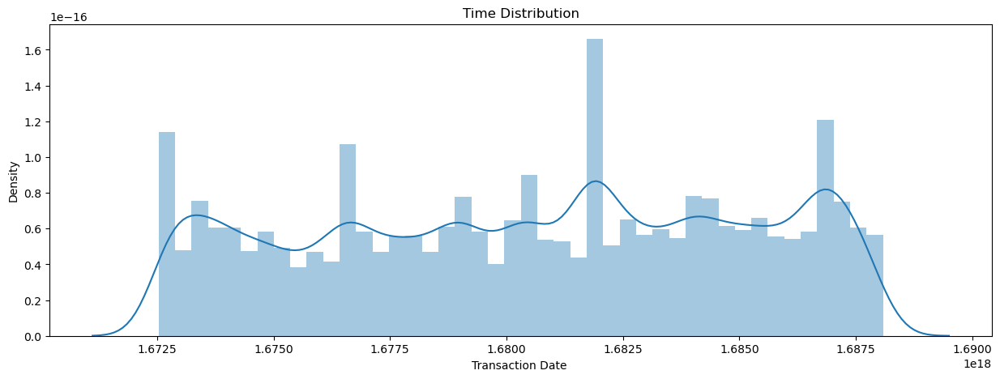

In [39]:
plt.figure(figsize=(15, 5))
plt.title('Time Distribution')
sns.distplot(df['Transaction Date ']) 
plt.show()

C:\Users\Sama Zuhd\AppData\Local\Temp\ipykernel_9672\415272943.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Amount USD'])


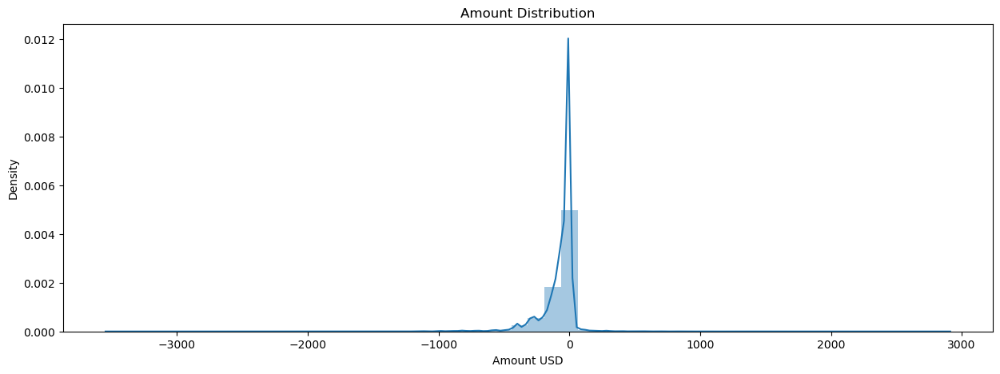

In [40]:
plt.figure(figsize=(15, 5))
plt.title('Amount Distribution')
sns.distplot(df['Amount USD']) 
plt.show()

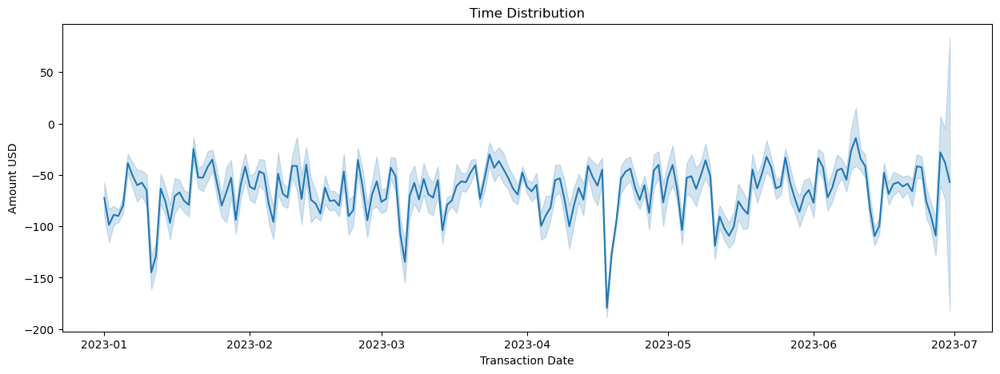

In [41]:
plt.figure(figsize=(15, 5))
plt.title('Time Distribution')
sns.lineplot(data=df, x='Transaction Date ', y='Amount USD')
plt.xlabel('Transaction Date')
plt.ylabel('Amount USD')
plt.show()

In [42]:
pip install --upgrade pip

In [44]:
pip install dataprep

  Using cached dataprep-0.4.1-py3-none-any.whl (3.5 MB)
  Using cached bokeh-2.4.3-py3-none-any.whl (18.5 MB)
  Using cached dask-2.30.0-py3-none-any.whl (848 kB)
  Using cached Flask-1.1.4-py2.py3-none-any.whl (94 kB)
  Using cached Flask_Cors-3.0.10-py2.py3-none-any.whl (14 kB)
  Obtaining dependency information for ipywidgets<8.0,>=7.5 from https://files.pythonhosted.org/packages/dc/0f/efa0531c38e7651d7b229e4746ed83ddd286d0ad80a316b175a4b14e8c1c/ipywidgets-7.8.0-py2.py3-none-any.whl.metadata
  Using cached ipywidgets-7.8.0-py2.py3-none-any.whl.metadata (1.9 kB)
  Using cached Jinja2-2.11.3-py2.py3-none-any.whl (125 kB)
  Using cached jsonpath_ng-1.5.3-py3-none-any.whl (29 kB)
  Using cached levenshtein-0.12.0.tar.gz (54 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached Metaphone-0.6-py3-none-any.whl
  Obtaining dependency information for pydantic<2.0,>=1.6 from https://files.pythonhosted.org/packages/e1/6b/6a68bd

  error: subprocess-exited-with-error
  
  python setup.py bdist_wheel did not run successfully.
  exit code: 1
  
  [28 lines of output]
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-cpython-311
  creating build\lib.win-amd64-cpython-311\Levenshtein
  copying Levenshtein\StringMatcher.py -> build\lib.win-amd64-cpython-311\Levenshtein
  copying Levenshtein\__init__.py -> build\lib.win-amd64-cpython-311\Levenshtein
  running egg_info
  writing levenshtein.egg-info\PKG-INFO
  writing dependency_links to levenshtein.egg-info\dependency_links.txt
  deleting levenshtein.egg-info\entry_points.txt
  writing namespace_packages to levenshtein.egg-info\namespace_packages.txt
  writing requirements to levenshtein.egg-info\requires.txt
  writing top-level names to levenshtein.egg-info\top_level.txt
  reading manifest file 'levenshtein.egg-info\SOURCES.txt'
  reading manifest template 'MANIFEST.in'
  adding license file 'COPYING'
  writing 

In [45]:
#from dataprep.eda import plot, plot_correlation, create_report, plot_missing

In [46]:
#plot(df)

In [47]:
#create_report(df)

In [48]:
#plot(df, "Amount USD")

#### 2.2 Data Visualization 

In [49]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


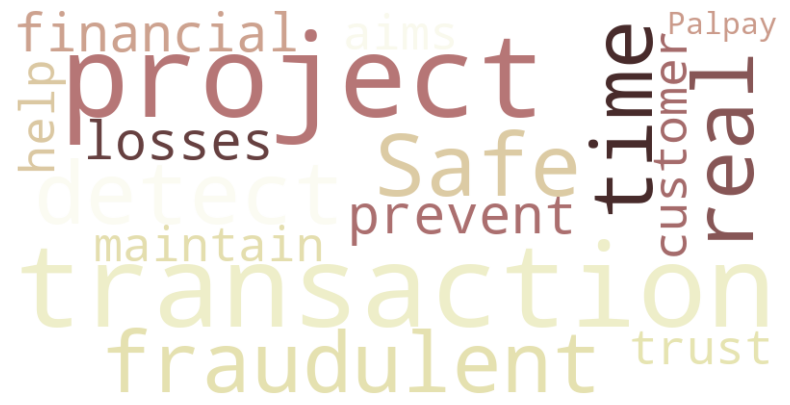

In [50]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Sample text data to introduct the idea of the project 
text_data = '''
Safe transaction , its a project to detect fraudulent transactions in real-time to
prevent financial losses and maintain customer trust. This project aims to help Palpay.
'''

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='pink').generate(text_data)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.title('')
plt.show()

In [51]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.decomposition import PCA

#### 2.2.1 Visualize The Data Before Processing

##### Pie Plots

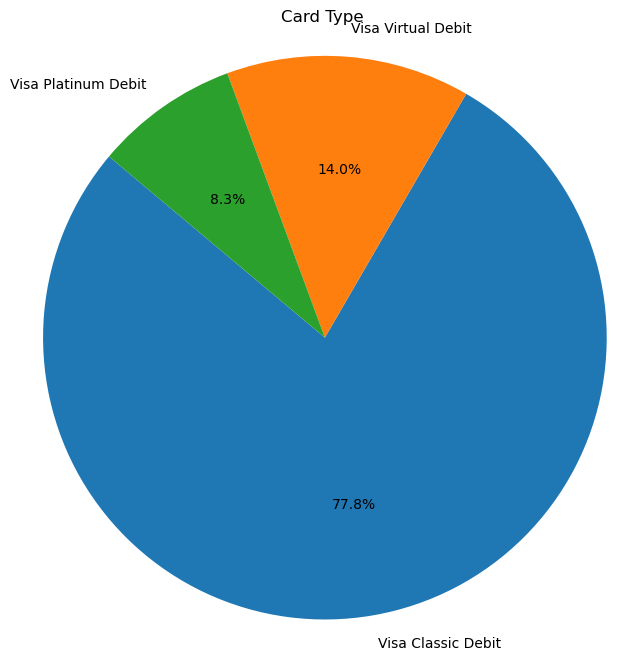

In [52]:
import pandas as pd
import matplotlib.pyplot as plt


card_type_counts = data['Card Type'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(card_type_counts, labels=card_type_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Card Type ')
plt.axis('equal')  
plt.show()

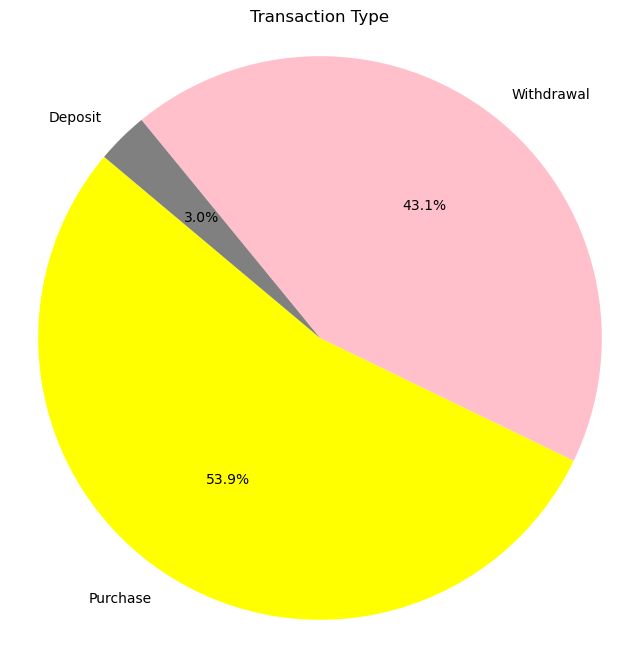

In [53]:
import pandas as pd
import matplotlib.pyplot as plt


card = data['Transaction Type'].value_counts()
custom_colors = ['yellow', 'pink', 'grey']


plt.figure(figsize=(8, 8))
plt.pie(card, labels=card.index, autopct='%1.1f%%', startangle=140, colors=custom_colors)
plt.title('Transaction Type')
plt.axis('equal')  
plt.show()

##### Histogram For Amount USD and Amount columns 

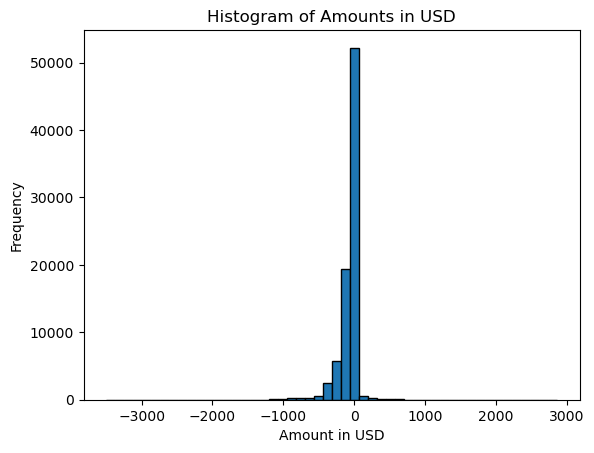

In [54]:
plt.hist(data['Amount USD'], bins=50, edgecolor='black')
plt.xlabel('Amount in USD')
plt.ylabel('Frequency')
plt.title('Histogram of Amounts in USD')
plt.show()

##### Time Series Plot

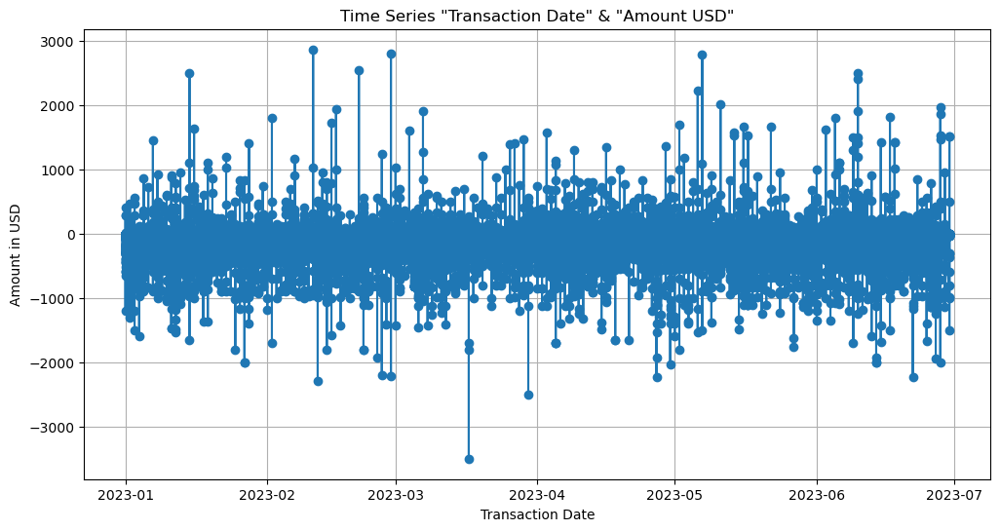

In [55]:
data['Transaction Date '] = pd.to_datetime(data['Transaction Date '])
plt.figure(figsize=(12, 6))
plt.plot(data['Transaction Date '], data['Amount USD'], marker='o')
plt.xlabel('Transaction Date')
plt.ylabel('Amount in USD')
plt.title('Time Series "Transaction Date" & "Amount USD"')
plt.grid(True)
plt.show()

###### WordCloud

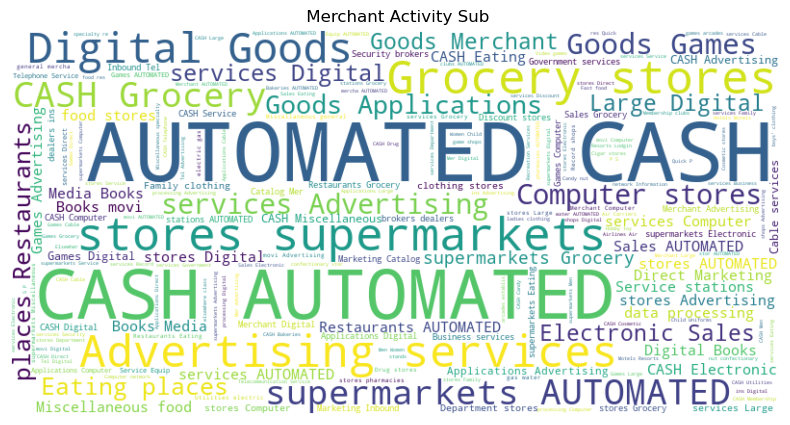

In [56]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

try:
    data = pd.read_csv('palpay_card_transactions_sample.csv')


    # Remove the extra space from the column name 'Merchant Activity sub '
    data.rename(columns={'Merchant Activity sub ': 'Merchant Activity sub'}, inplace=True)

    # Select the 'Merchant Activity sub' column data
    text_data = data['Merchant Activity sub']

    text_data_combined = " ".join(text_data)
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(text_data_combined)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')  # Turn off the axis
    plt.title(' Merchant Activity Sub')
    plt.show()

except KeyError as e:
    print(f"Error: {e}. The specified column name does not exist in the DataFrame.")
except FileNotFoundError:
    print("Error: The CSV file 'copy.csv' was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

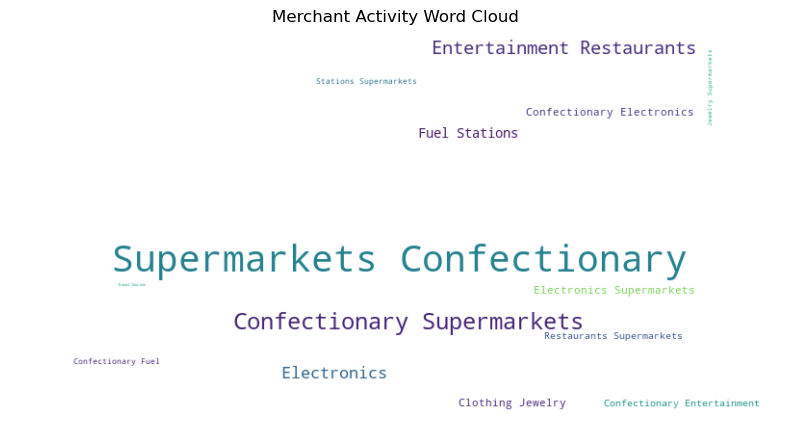

In [57]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

try:
    data = pd.read_csv('palpay_card_transactions_sample.csv')

    data.rename(columns={'Merchant Activity ': 'Merchant Activity'}, inplace=True)

    data['Merchant Activity'] = data['Merchant Activity'].astype(str).replace('nan', '').replace('NAN', '')

    text_data = data['Merchant Activity']

    text_data_combined = " ".join(text_data)
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(text_data_combined)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')  
    plt.title('Merchant Activity Word Cloud')
    plt.show()

except KeyError as e:
    print(f"Error: {e}. The specified column name does not exist in the DataFrame.")
except FileNotFoundError:
    print("Error: The CSV file 'copy.csv' was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

##### 2.2.2 Visualize The Data After Processing

In [58]:
df.rename(columns=lambda x: x.strip(), inplace=True)
print(df.columns)

Index(['Transaction Date', 'Card Type', 'Channel', 'Transaction Type',
       'Transaction Type Group', 'Entry Mode', 'Transaction Status',
       'Outlet ID', 'Merchant Country', 'Merchant Activity', 'Client Code',
       'Amount USD'],
      dtype='object')


##### Bar Chart

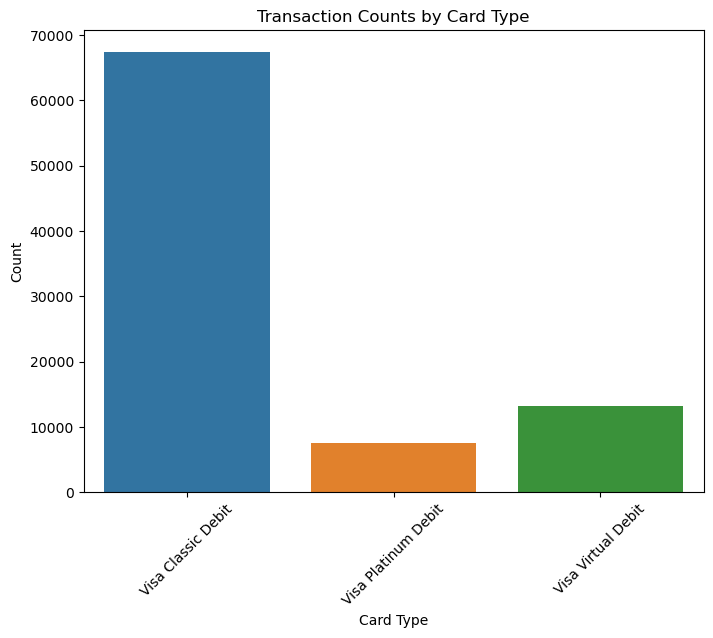

In [59]:
plt.figure(figsize=(8, 6))
sns.countplot(x='Card Type', data=data)
plt.title('Transaction Counts by Card Type')
plt.xlabel('Card Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

##### Time Series Plot

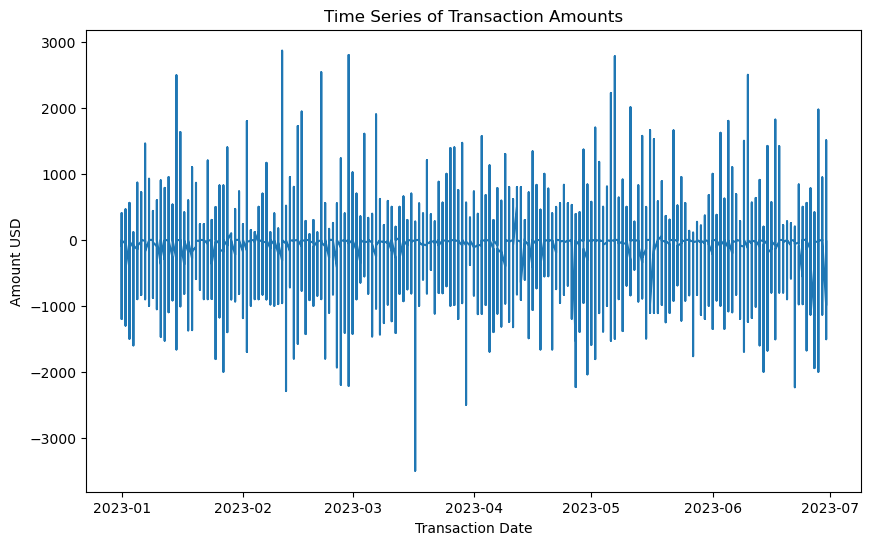

In [60]:
data['Transaction Date '] = pd.to_datetime(data['Transaction Date '])
plt.figure(figsize=(10, 6))
plt.plot(data['Transaction Date '], data['Amount USD'])
plt.title('Time Series of Transaction Amounts')
plt.xlabel('Transaction Date')
plt.ylabel('Amount USD')
plt.show()

##### Geographic Map as HTML file

In [61]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [62]:
import folium

state_geo = "us-states.json"

state_data = pd.read_csv('palpay data new.csv')

state_data.rename(columns={'Merchant Country ': 'Merchant Country'}, inplace=True)

m = folium.Map(location=[37, -102], zoom_start=5)

m.choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=state_data,
    columns=['Merchant Country', 'Amount USD'],
    key_on='feature.properties.name',
    fill_color='PuRd',
    fill_opacity=0.6,
    line_opacity=0.2,
    legend_name=' Amount in USD ($)'
)

# Save to html
m.save('folium_MAP.html')
print("Map Downloaded successfully")

C:\Users\Sama Zuhd\anaconda3\New folder\Lib\site-packages\folium\folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


Map Downloaded successfully


##### Sunburst Chart

In [63]:
import plotly.graph_objects as go
grouped_data = df.groupby(['Transaction Type', 'Card Type'])['Amount USD'].sum().reset_index()

# Create the Sunburst chart
fig = go.Figure(go.Sunburst(
    labels=grouped_data['Transaction Type'] + ' - ' + grouped_data['Card Type'],
    parents=grouped_data['Transaction Type'],
    values=grouped_data['Amount USD']
))

# Update layout and display the chart
fig.update_layout(title_text="Sunburst Chart", height=600)
fig.show()

##### Network Graph

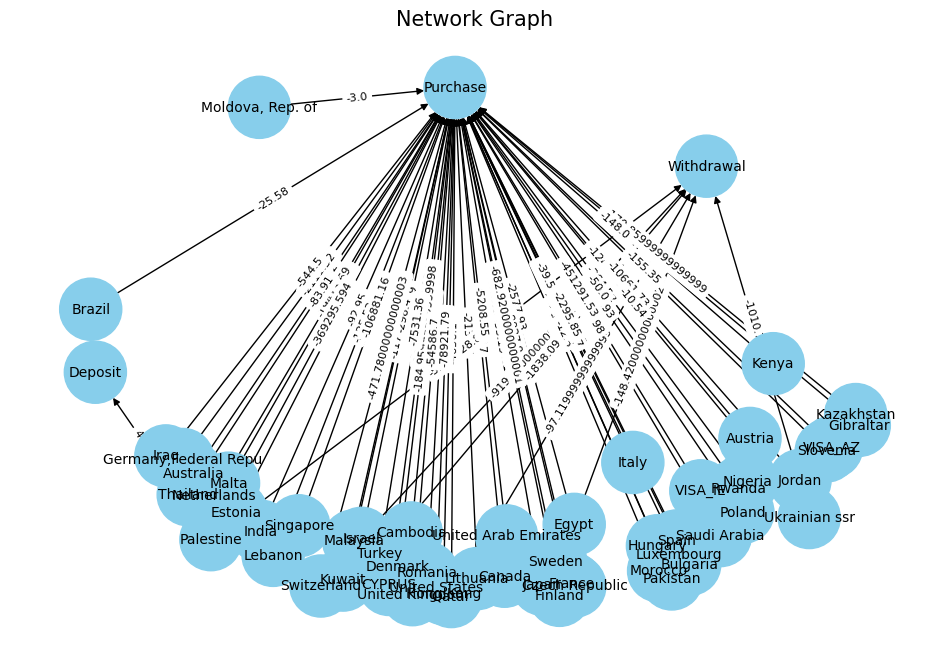

In [64]:
import networkx as nx
df.rename(columns={'Transaction Type': 'Transaction Type'}, inplace=True)

# Group data by 'Merchant Country' and 'Merchant Activity' and calculate the sum of 'Amount USD' for each group
grouped_data = df.groupby(['Merchant Country', 'Transaction Type'])['Amount USD'].sum().reset_index()

# Create a directed graph
G = nx.DiGraph()

# Add nodes (only 'Merchant Country') to the graph
G.add_nodes_from(grouped_data['Transaction Type'], node_color='skyblue', node_size=2000, label_pos='center')

# Add edges (Merchant Country -> Merchant Activity) to the graph with 'Amount USD' as edge weights
for _, row in grouped_data.iterrows():
    G.add_edge(row['Merchant Country'], row['Transaction Type'], weight=row['Amount USD'])

# Set node colors for better visualization
node_colors = {node: 'skyblue' for node in G.nodes()}

# Plot the network graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42, k=0.9)  # Adjust the 'k' parameter to control spacing between nodes
nx.draw_networkx(G, pos, with_labels=True, labels={node: node for node in G.nodes()}, font_size=10, node_color=[node_colors[n] for n in G.nodes()], node_size=2000, font_color='black')
labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=8)
plt.title('Network Graph', fontsize=15)
plt.axis('off')
plt.show()

##### Choropleth Map interactive

In [65]:
import plotly.express as px
geojson_data = 'us-states.json'

# Create a choropleth map
fig = px.choropleth(df, geojson=geojson_data, locations='Merchant Country', color='Amount USD', 
                    featureidkey='properties.name', projection='mercator')

fig.update_layout(title_text=' Amount USD by Merchant Country', title_x=0.7,
                  width=900, height=900)  

fig.show()

In [66]:
print(df.columns)

Index(['Transaction Date', 'Card Type', 'Channel', 'Transaction Type',
       'Transaction Type Group', 'Entry Mode', 'Transaction Status',
       'Outlet ID', 'Merchant Country', 'Merchant Activity', 'Client Code',
       'Amount USD'],
      dtype='object')


##### Grouped boxplot

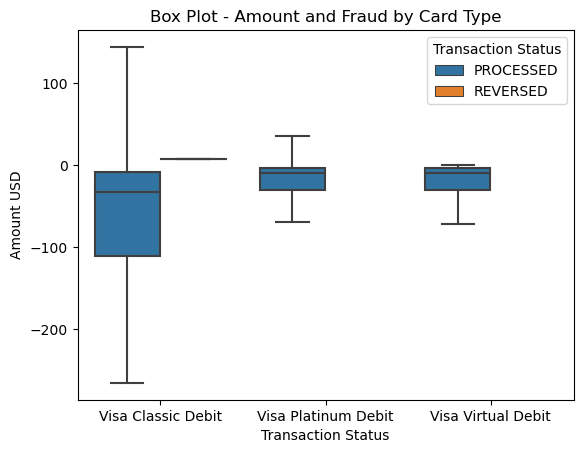

In [67]:
df = df.dropna(subset=['Amount USD'])

# Create a grouped boxplot
sns.boxplot(x='Card Type', y='Amount USD', hue='Transaction Status', data=df, showfliers=False)

plt.title('Box Plot - Amount and Fraud by Card Type')
plt.xlabel('Transaction Status')
plt.ylabel('Amount USD')
plt.legend(title='Transaction Status')

# Show the plot
plt.show()

### 3 Modeling

Our Goal is to implement an unsupervised machine learning approach using anomaly detection algorithms like Autoencoder and Clustering algorithms.

In [68]:
pip install --upgrade protobuf

Note: you may need to restart the kernel to use updated packages.


In [69]:
pip install tensorflow

  Obtaining dependency information for keras<2.14,>=2.13.1 from https://files.pythonhosted.org/packages/2e/f3/19da7511b45e80216cbbd9467137b2d28919c58ba1ccb971435cb631e470/keras-2.13.1-py3-none-any.whl.metadata
  Using cached keras-2.13.1-py3-none-any.whl.metadata (2.4 kB)
Using cached keras-2.13.1-py3-none-any.whl (1.7 MB)
  Attempting uninstall: keras
    Found existing installation: Keras 2.1.2
    Uninstalling Keras-2.1.2:
      Successfully uninstalled Keras-2.1.2
Note: you may need to restart the kernel to use updated packages.


In [70]:
pip install kneed

Note: you may need to restart the kernel to use updated packages.


In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# scikit-learn
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

# evaluation metrics
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import roc_auc_score

# scaling
from sklearn.preprocessing import StandardScaler

# autoencoder
import tensorflow as tf
from tensorflow import keras
# deep learning
from keras.models import Model, Sequential
from keras import regularizers
from keras.layers import  Input, Dense
from keras.optimizers import Adam
import os.path
import tarfile
import urllib
from kneed import KneeLocator
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score, silhouette_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

In [72]:
Df = pd.read_csv("palpay data new.csv")

In [73]:
Df.head()

,Transaction Date,Card Type,Channel,Transaction Type,Transaction Type Group,Entry Mode,Transaction Status,Outlet ID,Merchant Country,Merchant Activity,Client Code,Amount USD
0,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,Palestine,Cash withdrawal from the ATM,P00589393,-86.460
1,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,Palestine,Cash withdrawal from the ATM,P00589393,-28.820
2,1/1/2023,Visa Classic Debit,POS,Purchase,Purchases,Chip & Pin,PROCESSED,110002413,Palestine,Supermarkets & Confectionary,P00589801,-14.409
3,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,Palestine,Cash withdrawal from the ATM,P00565050,-317.000
4,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,800000010,Palestine,Cash withdrawal from the ATM,P00575741,-43.230


In [74]:
Df.columns

Index(['Transaction Date ', 'Card Type', 'Channel ', 'Transaction Type',
       'Transaction Type Group', 'Entry Mode', 'Transaction Status ',
       'Outlet ID', 'Merchant Country', 'Merchant Activity ', 'Client Code',
       'Amount USD'],
      dtype='object')

In [75]:
columns=[ 'Card Type', 'Channel ', 'Transaction Type',
       'Transaction Type Group', 'Entry Mode','Outlet ID', 'Merchant Country', 'Merchant Activity ', 'Client Code',
       'Amount USD']
palpay_data = Df[columns].copy()

#### 3.1Encoding Categorical variables (LabelEncoder)

In [76]:
from sklearn.preprocessing import LabelEncoder


# Assuming your dataframe is named 'palpay_data'
categorical_cols=[ 'Card Type', 'Channel ', 'Transaction Type',
       'Transaction Type Group', 'Entry Mode','Outlet ID', 'Merchant Country', 'Merchant Activity ', 'Client Code']

# Create a new dataframe to store the encoded data
encoded_data = palpay_data.copy()

# Apply label encoding to categorical columns
label_encoder = LabelEncoder()
for col in categorical_cols:
    encoded_data[col] = label_encoder.fit_transform(palpay_data[col])

# Print the encoded dataframe
print(encoded_data.head())

   Card Type  Channel   Transaction Type  Transaction Type Group  Entry Mode  \
0          0         0                 2                       0           0   
1          0         0                 2                       0           0   
2          0         2                 1                       1           0   
3          0         0                 2                       0           0   
4          0         0                 2                       0           4   

   Outlet ID  Merchant Country  Merchant Activity   Client Code  Amount USD  
0        529                36                   1         6733     -86.460  
1        529                36                   1         6733     -28.820  
2        535                36                  10         6769     -14.409  
3        529                36                   1         4619    -317.000  
4       1988                36                   1         6165     -43.230  


In [77]:
unique_counts = encoded_data[categorical_cols].nunique()

# Print the count of unique values for each column
print(unique_counts)

Card Type                    3
Channel                      3
Transaction Type             3
Transaction Type Group       2
Entry Mode                   6
Outlet ID                 2262
Merchant Country            55
Merchant Activity           15
Client Code               9511
dtype: int64


##### K-means

In [78]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# for higher number of clusters is required a higher k_max
# k_max must be at least three times bigger than the expected k
k_max = 20 # Number of cluster 
# A list holds the SSE values for each k
sse = []
for k in range(1, k_max):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(encoded_data)
    sse.append(kmeans.inertia_)

C:\Users\Sama Zuhd\anaconda3\New folder\Lib\site-packages\joblib\externals\loky\backend\context.py:110: UserWarning:

Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "C:\Users\Sama Zuhd\anaconda3\New folder\Lib\site-packages\joblib\externals\loky\backend\context.py", line 217, in _count_physical_cores
    raise ValueError(


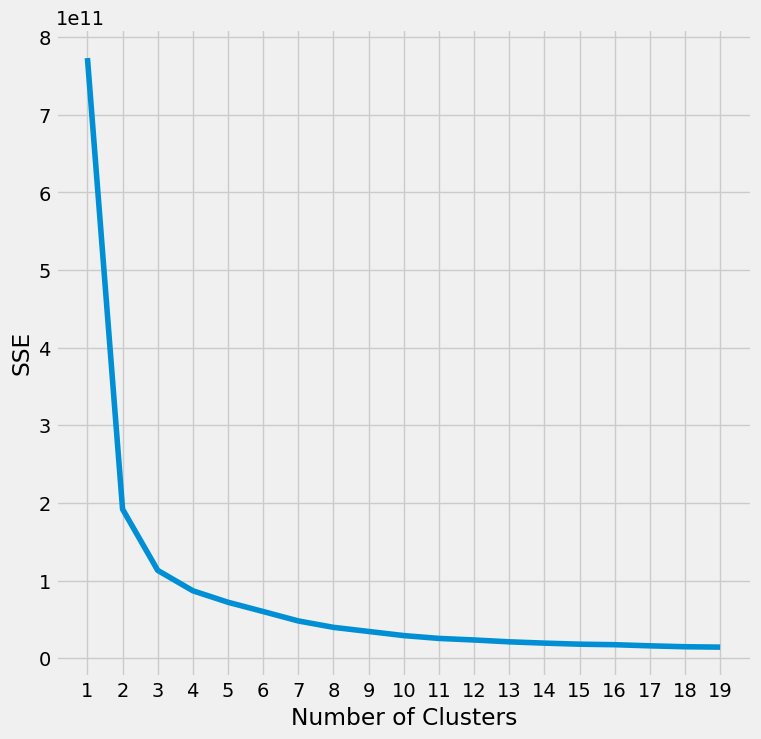

In [79]:
# plot the SSE values
plt.style.use("fivethirtyeight")
plt.figure(figsize=(8, 8))
plt.plot(range(1, k_max), sse)
plt.xticks(range(1, k_max))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

##### Scaling the numerical variable (MinMaxScaler)

In [80]:
# Initialize the preprocessor, which preprocess the dataset to give it the optimal format
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("pca", PCA(n_components=2, random_state=1)),
    ]
)
# Initialize the clusterer, where is configured the KMeans clusterer
clusterer = Pipeline(
   [
       (
           "kmeans",
           KMeans(
               n_clusters=2,
               init="k-means++",
               n_init=10,
               max_iter=300,
               random_state=325,
           ),
       ),
   ]
)
# Initialize the complete pipeline. First the data will be processed and then clustering will run.
pipe = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("clusterer", clusterer)
    ]
)

In [81]:
pipe.fit(encoded_data)

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('scaler', MinMaxScaler()),
                                 ('pca',
                                  PCA(n_components=2, random_state=1))])),
                ('clusterer',
                 Pipeline(steps=[('kmeans',
                                  KMeans(n_clusters=2, n_init=10,
                                         random_state=325))]))])

##### Evaluation of the model using silhouette scoring criteria (Unsupervised ML scoring criteria)

In [82]:
preprocessed_data = pipe["preprocessor"].transform(encoded_data)

predicted_labels = pipe["clusterer"]["kmeans"].labels_

silhouette_score(preprocessed_data, predicted_labels)

0.6367649410684109

In [83]:
preprocessed_data.shape

(82634, 2)

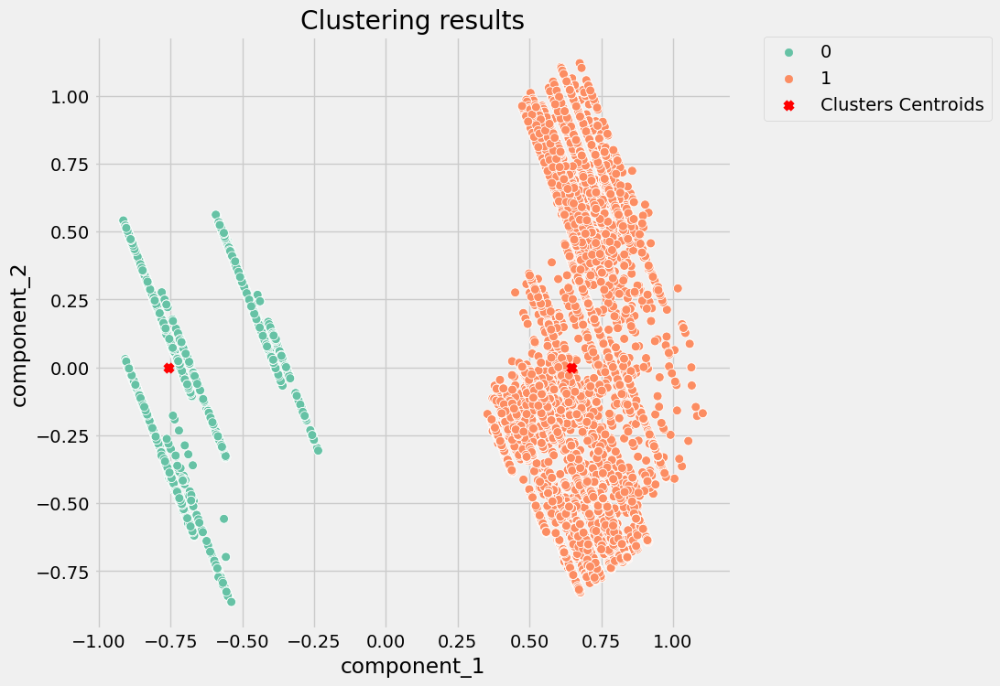

In [84]:
centers = pipe["clusterer"]["kmeans"].cluster_centers_  # centroids
pcadf = pd.DataFrame(
    pipe["preprocessor"].transform(encoded_data),
    columns=["component_1", "component_2"],
)

pcadf["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_
# pcadf["true_label"] = pipe["clusterer"]["kmeans"].labels_#label_encoder.inverse_transform(true_labels)

plt.style.use("fivethirtyeight")
plt.figure(figsize=(8, 8))

scat = sns.scatterplot(
    x="component_1",
    y="component_2",
    s=50,
    data=pcadf,
    hue="predicted_cluster",
    # style="true_label",
    palette="Set2",
)

scat.set_title(
    "Clustering results"
)
plt.scatter(centers[:, 0], centers[:, 1], marker="x", color='r', label='Clusters Centroids')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

In [85]:
zeros_count = pcadf["predicted_cluster"].value_counts()[0]
ones_count = pcadf["predicted_cluster"].value_counts()[1]

print("Number of zeros:", zeros_count)
print("Number of ones:", ones_count)

Number of zeros: 38061
Number of ones: 44573


##### Isloation Forest Algorithm

In [86]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test = train_test_split(encoded_data, test_size=0.2, random_state=42)

# Print the shapes of the training and testing sets
print("Training set shape:", X_train.shape)
print("Testing set shape:", X_test.shape)

Training set shape: (66107, 10)
Testing set shape: (16527, 10)


In [87]:
# outlier_fraction=0.00005
clf = IsolationForest(n_estimators=100, max_samples=len(X_train), random_state=42)#, contamination=outlier_fraction)

clf.fit(X_train)
y_pred = clf.predict(X_test)

print("Predicted Anomalous Data Points: ", len(y_pred[y_pred == -1]))
print("Predicted Non Anomalous Data Points: ", len(y_pred[y_pred == 1]))
print("=======================================================")

Predicted Anomalous Data Points:  1682
Predicted Non Anomalous Data Points:  14845


##### Local Outlier Factor

In [88]:
from sklearn.neighbors import LocalOutlierFactor

lof = LocalOutlierFactor(
    n_neighbors=20,
    algorithm="auto",
    leaf_size=30,
    metric="minkowski",
    p=2,
    metric_params=None
    # contamination=outlier_fraction,
)

lof.fit(X_train)
y_pred_lof = lof.fit_predict(X_test)


print("Predicted Anomalous Data Points: ", len(y_pred_lof[y_pred_lof == -1]))
print("Predicted Non Anomalous Data Points: ", len(y_pred_lof[y_pred_lof == 1]))
print("================================================================")

Predicted Anomalous Data Points:  1680
Predicted Non Anomalous Data Points:  14847


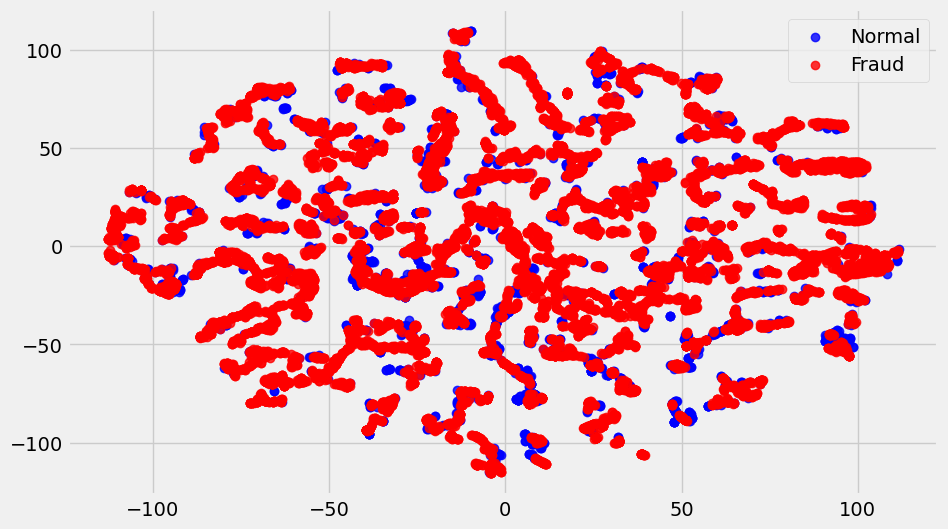

In [89]:
def dimensionality_plot(X, y):

    #     sns.set(style='whitegrid', palette='muted')

    # Initializing TSNE object with 2 principal components
    tsne = TSNE(n_components=2, random_state=42)

    # Fitting the data
    X_trans = tsne.fit_transform(X)

    plt.figure(figsize=(10, 6))

    plt.scatter(
        X_trans[np.where(y == -1), 0],
        X_trans[np.where(y == -1), 1],
        marker="o",
        color="b",
        linewidth=1,
        alpha=0.8,
        label="Normal",
    )

    plt.scatter(
        X_trans[np.where(y == 1), 0],
        X_trans[np.where(y == 1), 1],
        marker="o",
        color="r",
        linewidth=1,
        alpha=0.8,
        label="Fraud",
    )

    plt.legend(loc="best")

    plt.show()
y_pred=np.reshape(y_pred_lof, (-1, 1))
dimensionality_plot(X_test, y_pred)

In [90]:
Df.columns

Index(['Transaction Date ', 'Card Type', 'Channel ', 'Transaction Type',
       'Transaction Type Group', 'Entry Mode', 'Transaction Status ',
       'Outlet ID', 'Merchant Country', 'Merchant Activity ', 'Client Code',
       'Amount USD'],
      dtype='object')

##### Auto-Encoder 

In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import tensorflow as tf
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
mpl.rcParams['figure.figsize'] = (10, 5)
mpl.rcParams['axes.grid'] = False

Df['Amount USD']=Df['Amount USD'].astype("float64")
# Convert columns with "object" data type to string
Df['Card Type'] = Df['Card Type'].astype(str)
Df['Channel '] = Df['Channel '].astype(str)
Df['Transaction Type'] = Df['Transaction Type'].astype(str)
Df['Transaction Type Group'] = Df['Transaction Type Group'].astype(str)
Df['Entry Mode'] = Df['Entry Mode'].astype(str)
Df['Outlet ID'] = Df['Outlet ID'].astype(str)
Df['Merchant Country'] = Df['Merchant Country'].astype(str)
Df['Merchant Activity '] = Df['Merchant Activity '].astype(str)
Df['Client Code'] = Df['Client Code'].astype(str)
Df.head()

,Transaction Date,Card Type,Channel,Transaction Type,Transaction Type Group,Entry Mode,Transaction Status,Outlet ID,Merchant Country,Merchant Activity,Client Code,Amount USD
0,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,Palestine,Cash withdrawal from the ATM,P00589393,-86.460
1,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,Palestine,Cash withdrawal from the ATM,P00589393,-28.820
2,1/1/2023,Visa Classic Debit,POS,Purchase,Purchases,Chip & Pin,PROCESSED,110002413,Palestine,Supermarkets & Confectionary,P00589801,-14.409
3,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Chip & Pin,PROCESSED,110002011,Palestine,Cash withdrawal from the ATM,P00565050,-317.000
4,1/1/2023,Visa Classic Debit,ATM,Withdrawal,ATM Transactions,Other,PROCESSED,800000010,Palestine,Cash withdrawal from the ATM,P00575741,-43.230


In [92]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test = train_test_split(encoded_data, test_size=0.2, random_state=42)

# Print the shapes of the training and testing sets
print("Training set shape:", X_train.shape)
print("Testing set shape:", X_test.shape)

Training set shape: (66107, 10)
Testing set shape: (16527, 10)


In [93]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(encoded_data)
X_train_scaled, X_test_scaled = train_test_split(X_scaled, test_size=0.2)#, random_state=42)

In [94]:
class AutoEncoder(Model):
  def __init__(self):
    super(AutoEncoder, self).__init__()
    self.encoder = tf.keras.Sequential([
                  tf.keras.layers.Dense(8, activation="linear"),
                  tf.keras.layers.Dense(6, activation="linear"),

              ])
    self.decoder = tf.keras.Sequential([
                  tf.keras.layers.Dense(8, activation="linear"),
                  # tf.keras.layers.Dense(32, activation="relu"),
                  # tf.keras.layers.Dense(64, activation="relu"),
                  # tf.keras.layers.Dense(10, activation="sigmoid")
                  tf.keras.layers.Dense(10, activation="linear")
              ])
  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded
model = AutoEncoder()
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=200, mode="min")
model.compile(optimizer='adam', loss="mae")
history = model.fit(X_train_scaled, X_train_scaled, epochs=200, batch_size=128,
                    validation_split=0.2,
                    shuffle=True,
                    callbacks=[early_stopping]
                    )

Epoch 1/200
414/414 [==============================] - 4s 5ms/step - loss: 0.4540 - val_loss: 0.2620
Epoch 2/200
414/414 [==============================] - 2s 4ms/step - loss: 0.2124 - val_loss: 0.1920
Epoch 3/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1877 - val_loss: 0.1844
Epoch 4/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1811 - val_loss: 0.1795
Epoch 5/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1779 - val_loss: 0.1780
Epoch 6/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1768 - val_loss: 0.1777
Epoch 7/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1763 - val_loss: 0.1771
Epoch 8/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1755 - val_loss: 0.1757
Epoch 9/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1728 - val_loss: 0.1713
Epoch 10/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1656 - val_lo

414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1380
Epoch 82/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1377
Epoch 83/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1378
Epoch 84/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1382
Epoch 85/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1381
Epoch 86/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1378
Epoch 87/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1378
Epoch 88/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1380
Epoch 89/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1377
Epoch 90/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 

Epoch 161/200
414/414 [==============================] - 1s 4ms/step - loss: 0.1382 - val_loss: 0.1380
Epoch 162/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1378
Epoch 163/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1382 - val_loss: 0.1377
Epoch 164/200
414/414 [==============================] - 1s 4ms/step - loss: 0.1382 - val_loss: 0.1379
Epoch 165/200
414/414 [==============================] - 1s 3ms/step - loss: 0.1383 - val_loss: 0.1378
Epoch 166/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1382 - val_loss: 0.1378
Epoch 167/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1383 - val_loss: 0.1377
Epoch 168/200
414/414 [==============================] - 1s 3ms/step - loss: 0.1382 - val_loss: 0.1376
Epoch 169/200
414/414 [==============================] - 2s 4ms/step - loss: 0.1382 - val_loss: 0.1382
Epoch 170/200
414/414 [==============================] - 1s 3ms/step - lo

In [95]:
encoder_out = model.encoder(X_test_scaled).numpy() #8 unit representation of data
decoder_out = model.decoder(encoder_out).numpy()

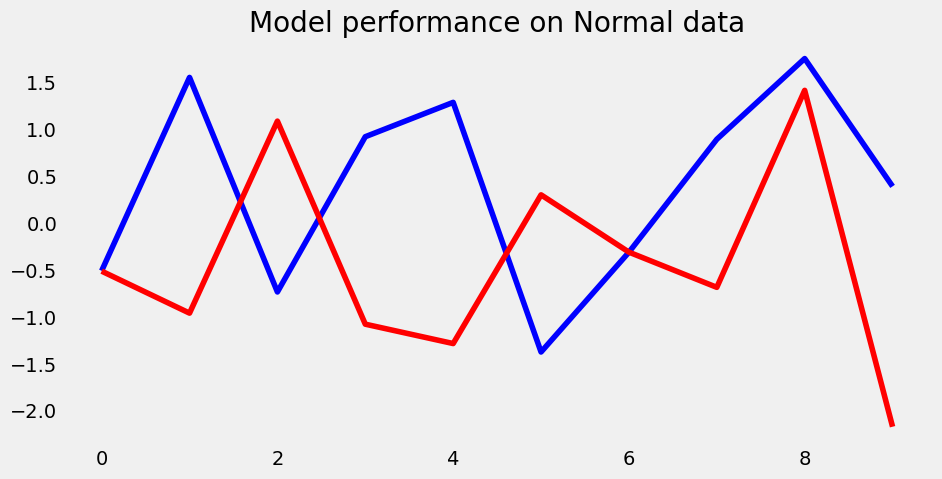

In [96]:
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10, 5)
mpl.rcParams['axes.grid'] = False
plt.plot(X_train_scaled[0], 'b')
plt.plot(decoder_out[0], 'r')
plt.title("Model performance on Normal data")
plt.show()

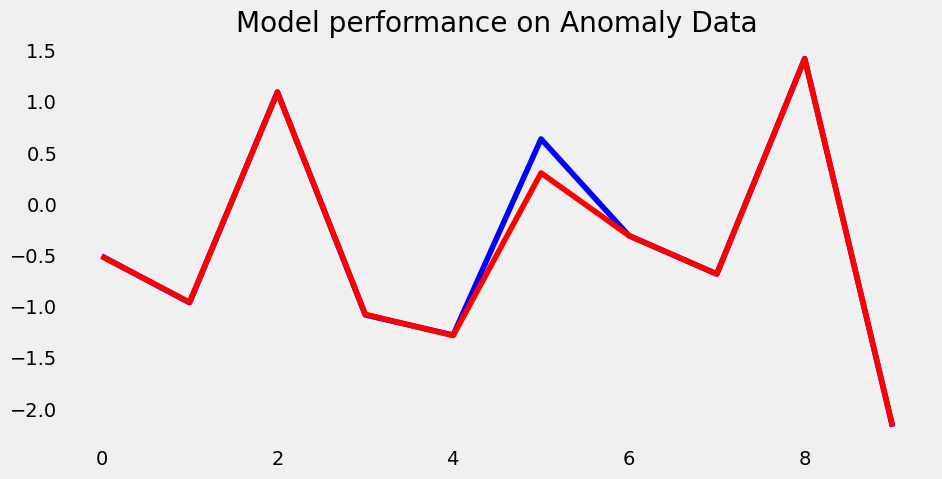

In [97]:
encoder_out_a = model.encoder(X_test_scaled).numpy() #8 unit representation of data
decoder_out_a = model.decoder(encoder_out_a).numpy()
plt.plot(X_test_scaled[0], 'b')
plt.plot(decoder_out_a[0], 'r')
plt.title("Model performance on Anomaly Data")
plt.show()

2066/2066 [==============================] - 5s 2ms/step


(array([8.451e+03, 3.079e+03, 1.838e+03, 2.953e+03, 3.719e+03, 1.902e+03,
        4.136e+03, 3.912e+03, 3.157e+03, 8.115e+03, 3.559e+03, 2.780e+03,
        1.962e+03, 1.117e+03, 2.889e+03, 3.930e+03, 1.027e+03, 9.250e+02,
        4.270e+02, 7.030e+02, 3.420e+02, 4.260e+02, 1.590e+02, 4.560e+02,
        4.210e+02, 4.410e+02, 2.350e+02, 3.540e+02, 3.350e+02, 1.280e+02,
        2.880e+02, 3.470e+02, 3.780e+02, 2.780e+02, 2.060e+02, 4.570e+02,
        2.400e+01, 1.050e+02, 1.100e+01, 3.700e+01, 2.700e+01, 6.000e+00,
        1.100e+01, 1.300e+01, 2.300e+01, 1.000e+00, 4.000e+00, 4.000e+00,
        6.000e+00, 3.000e+00]),
 array([0.00093506, 0.01526193, 0.02958881, 0.04391568, 0.05824255,
        0.07256943, 0.0868963 , 0.10122317, 0.11555005, 0.12987692,
        0.14420379, 0.15853067, 0.17285754, 0.18718441, 0.20151128,
        0.21583816, 0.23016503, 0.2444919 , 0.25881878, 0.27314565,
        0.28747252, 0.3017994 , 0.31612627, 0.33045314, 0.34478002,
        0.35910689, 0.37343376, 0.38

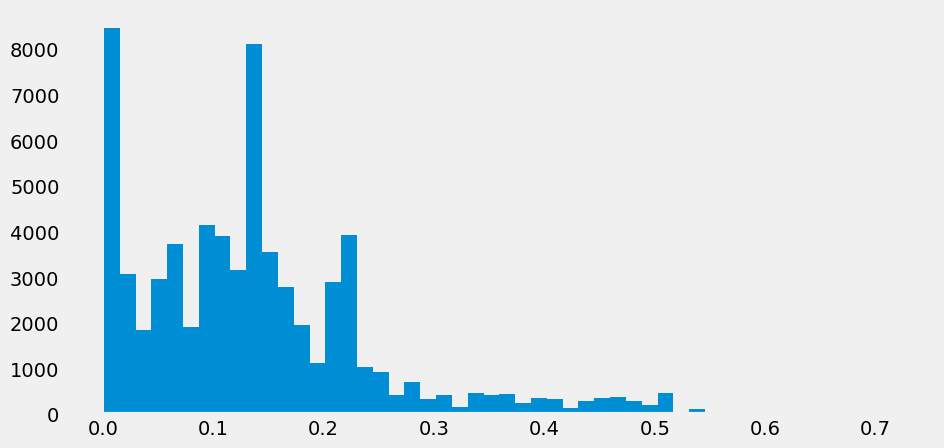

In [98]:
reconstruction = model.predict(X_train_scaled)
train_loss = tf.keras.losses.mae(reconstruction, X_train_scaled)
plt.hist(train_loss, bins=50)

517/517 [==============================] - 1s 2ms/step


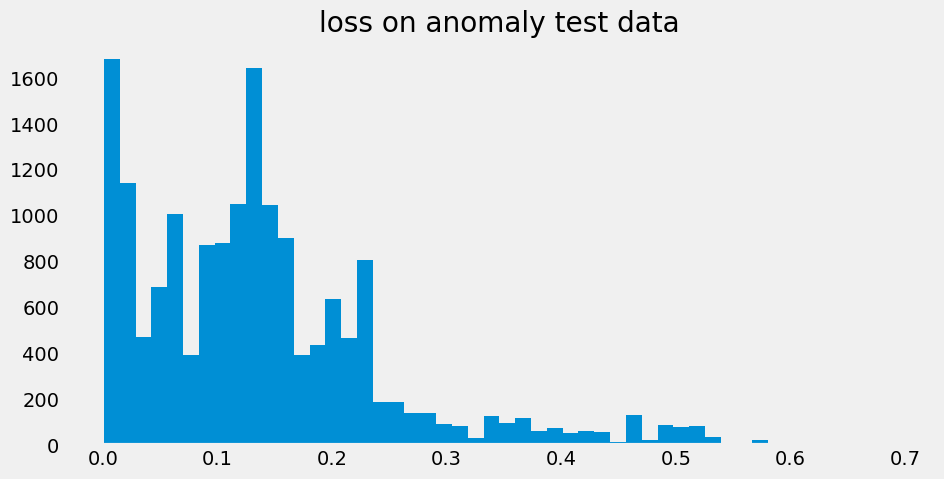

In [99]:
threshold = np.mean(train_loss) + 2*np.std(train_loss)
reconstruction_a = model.predict(X_test_scaled)
train_loss_a = tf.keras.losses.mae(reconstruction_a, X_test_scaled)
plt.hist(train_loss_a, bins=50)
plt.title("loss on anomaly test data")
plt.show()

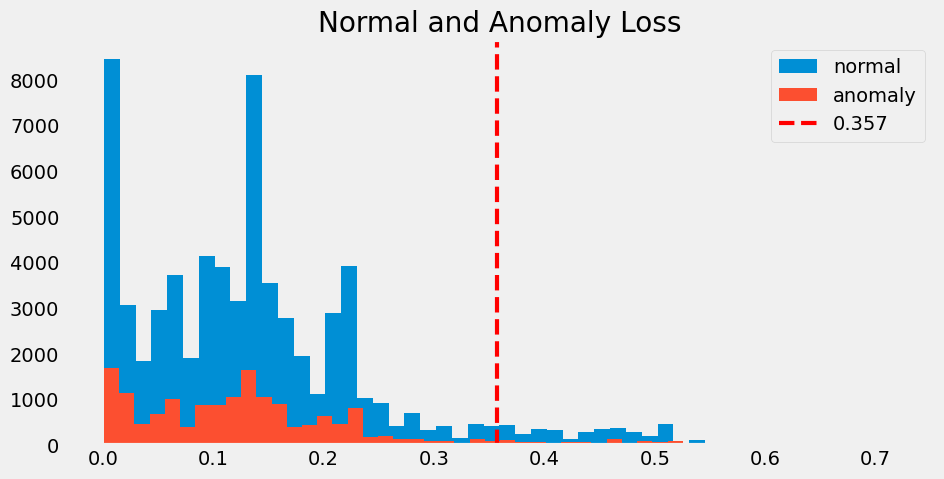

In [100]:
plt.hist(train_loss, bins=50, label='normal')
plt.hist(train_loss_a, bins=50, label='anomaly')
plt.axvline(threshold, color='r', linewidth=3, linestyle='dashed', label='{:0.3f}'.format(threshold))
plt.legend(loc='upper right')
plt.title("Normal and Anomaly Loss")
plt.show()

Text(0.5, 1.0, 'Loss Curves')

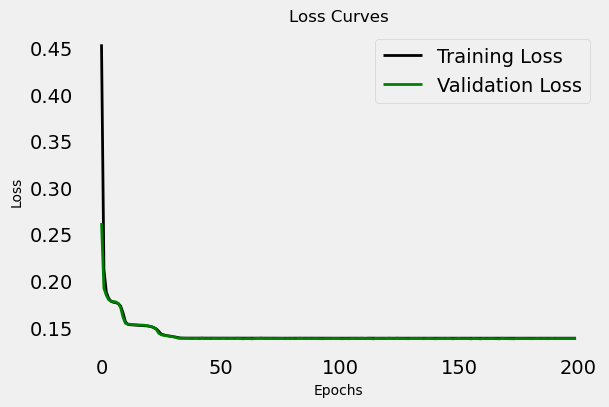

In [101]:
# Loss curve

plt.figure(figsize=[6, 4])
plt.plot(history.history["loss"], "black", linewidth=2.0)
plt.plot(history.history["val_loss"], "green", linewidth=2.0)
plt.legend(["Training Loss", "Validation Loss"], fontsize=14)
plt.xlabel("Epochs", fontsize=10)
plt.ylabel("Loss", fontsize=10)
plt.title("Loss Curves", fontsize=12)

In [102]:
preds = tf.math.less(train_loss, threshold)
tf.math.count_nonzero(preds)

<tf.Tensor: shape=(), dtype=int64, numpy=62375>

In [103]:
preds_a = tf.math.greater(train_loss_a, threshold)
tf.math.count_nonzero(preds_a)

<tf.Tensor: shape=(), dtype=int64, numpy=926>

In [104]:
columns=[ 'Card Type', 'Channel ', 'Transaction Type','Transaction Type Group', 'Entry Mode','Outlet ID', 'Merchant Country', 'Merchant Activity ', 'Client Code','Amount USD']
palpay_data = Df[columns].copy()
unseen = [ 'Visa Classic Debit', 'POS','Purchase', 'Purchases', 'Chip & Pin',  '110002413', 'Heborn', 'Supermarkets & Confectionary', 'P00549853', -1010101.409]
new_row_df = pd.DataFrame([unseen], columns=palpay_data.columns)

# Append the new row to the palpay_data DataFrame
palpay_data = palpay_data.append(new_row_df)#, ignore_index=True)

C:\Users\Sama Zuhd\AppData\Local\Temp\ipykernel_9672\4239007058.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [105]:
last_row = palpay_data.iloc[-1]
last_row

Card Type                           Visa Classic Debit
Channel                                            POS
Transaction Type                              Purchase
Transaction Type Group                       Purchases
Entry Mode                                  Chip & Pin
Outlet ID                                    110002413
Merchant Country                                Heborn
Merchant Activity         Supermarkets & Confectionary
Client Code                                  P00549853
Amount USD                                -1010101.409
Name: 0, dtype: object

In [106]:
encoded_data = palpay_data.copy()
categorical_cols=[ 'Card Type', 'Channel ', 'Transaction Type','Transaction Type Group', 'Entry Mode','Outlet ID', 'Merchant Country', 'Merchant Activity ', 'Client Code']
# Apply label encoding to categorical columns
label_encoder = LabelEncoder()
for col in categorical_cols:
    encoded_data[col] = label_encoder.fit_transform(palpay_data[col])
X_scaled = scaler.fit_transform(encoded_data)
unseen_scaled =X_scaled[-1]

In [107]:
unseen_scaled=np.array(unseen_scaled).reshape(1,-1)
threshold = np.mean(train_loss) + 2*np.std(train_loss)
reconstruction_n = model.predict(unseen_scaled)
train_loss_n = tf.keras.losses.mae(reconstruction_n, unseen_scaled)
train_loss_n,threshold
if train_loss_n< threshold:
  print(" transaction is normal")
else:
  print(" transaction is fraud")

1/1 [==============================] - 0s 52ms/step
 transaction is fraud


In [108]:
reconstruction_n

array([[-6.2709033e-01,  3.2755916e+00, -8.7862176e-01,  1.2791630e+00,
        -1.3504026e+00,  1.5222201e+00, -2.8252571e+00,  2.4811013e+00,
        -2.2232874e-01, -2.8704849e+02]], dtype=float32)

In [109]:
unseen_scaled

array([[-5.07006068e-01,  1.55706980e+00, -7.32865893e-01,
         9.24058131e-01, -1.27893705e+00, -1.59365442e+00,
        -2.71028804e+00,  1.68623706e+00, -1.19790178e-01,
        -2.87198797e+02]])

In [110]:
import joblib
import tensorflow as tf

# Save the trained model and scaler
model.save("autoencoder_model", save_format="tf")
joblib.dump(scaler, "scaler.pkl")

# Load the model and scaler
loaded_model = tf.keras.models.load_model("autoencoder_model")
loaded_scaler = joblib.load("scaler.pkl")

INFO:tensorflow:Assets written to: autoencoder_model\assets


INFO:tensorflow:Assets written to: autoencoder_model\assets


In [111]:
import tensorflow as tf
import numpy as np

with open('threshold.txt', 'w') as f:
    f.write(str(threshold))

In [112]:
#from tensorflow.keras.models import model_from_json
#model_in_json = model.to_json()
#with open('model.json','w') as json_file:
#    json_file.write(model_in_json)

In [113]:
#model_file = open("model.json",'r')
#json_model=model_file.read()
#model2 = model_from_json(json_model)

In [114]:
#json_model

In [115]:
import json 
import numpy as np

def save_autoencoder_json(model, filepath, X_train):
    if isinstance(X_train, pd.DataFrame):
        X_train = X_train.to_numpy()  # Convert DataFrame to NumPy array
        
    saved_model = {
        "encoder_layers": [layer.get_config() for layer in model.encoder.layers],
        "decoder_layers": [layer.get_config() for layer in model.decoder.layers],
        "X_train": X_train.tolist() if X_train is not None else "None"
    }

    json_txt = json.dumps(saved_model, indent=4)
    with open(filepath, "w") as file:
        file.write(json_txt)
# Save the AutoEncoder model configuration
file_path = 'autoencoder_model.json'
save_autoencoder_json(model, file_path, X_train)

In [116]:
def load_autoencoder_json(filepath):
    with open(filepath, "r") as file:
        saved_model = json.load(file)
    
    return saved_model

# Load the AutoEncoder model configuration from the saved JSON file
loaded_autoencoder_config = load_autoencoder_json('autoencoder_model.json')

# Print the loaded AutoEncoder model configuration
print(loaded_autoencoder_config)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [117]:
loaded_autoencoder_config

{'encoder_layers': [{'name': 'dense',
   'trainable': True,
   'dtype': 'float32',
   'units': 8,
   'activation': 'linear',
   'use_bias': True,
   'kernel_initializer': {'module': 'keras.initializers',
    'class_name': 'GlorotUniform',
    'config': {'seed': None},
    'registered_name': None},
   'bias_initializer': {'module': 'keras.initializers',
    'class_name': 'Zeros',
    'config': {},
    'registered_name': None},
   'kernel_regularizer': None,
   'bias_regularizer': None,
   'activity_regularizer': None,
   'kernel_constraint': None,
   'bias_constraint': None},
  {'name': 'dense_1',
   'trainable': True,
   'dtype': 'float32',
   'units': 6,
   'activation': 'linear',
   'use_bias': True,
   'kernel_initializer': {'module': 'keras.initializers',
    'class_name': 'GlorotUniform',
    'config': {'seed': None},
    'registered_name': None},
   'bias_initializer': {'module': 'keras.initializers',
    'class_name': 'Zeros',
    'config': {},
    'registered_name': None},
   '

In [118]:
#-------------------------------------------

In [119]:
model_json = model.to_json()
with open("model_architecture.json", "w") as json_file:
    json_file.write(model_json)

In [120]:
model.save_weights("model_weights.h5")

In [121]:
from tensorflow.keras.models import model_from_json

# Load the model architecture from JSON
with open("model_architecture.json", "r") as json_file:
    loaded_model_json = json_file.read()

# Reconstruct the model from the loaded JSON architecture
loaded_model = model_from_json(loaded_model_json)